[View in Colaboratory](https://colab.research.google.com/github/cyyeh/2018AI_summer_school/blob/master/Neural_Turing_Machine.ipynb)

In [3]:
import tensorflow as tf
import numpy as np
import argparse
import matplotlib.pyplot as plt
from IPython import display
import os
from google.colab import files
print(tf.__version__)
!nvidia-smi
%matplotlib inline

1.9.0
Mon Aug  6 03:51:44 2018       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 384.111                Driver Version: 384.111                   |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8    30W / 149W |      1MiB / 11439MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
| 

## Section B. Addressing
![Imgur](https://i.imgur.com/5SsUoUM.png)

Content Addressing             |  Gate Interpolation
:-------------------------:|:-------------------------:
![Imgur](https://i.imgur.com/s8GTafa.png)  |  ![Imgur](https://i.imgur.com/y64t0c2.png)

Convolution Shift             |  Sharpening
:-------------------------:|:-------------------------:
![Imgur](https://i.imgur.com/83o9k9o.png)  |  ![Imgur](https://i.imgur.com/r2Zf3qH.png)

In [0]:
def addressing(k, beta, g, s, gamma, prev_M, prev_w, addressing_mode, shift_range, memory_size):
    """
    Reading (Refer to Sec. B)
    Read Content from Memory.

    Inputs:
    - k: Array of memory key. Shape = (number of batch, memory_vector_dim)
    - beta: Array of key strength. Shape = (number of batch)
    - g: Array of interpolation gate. Shape = (number of batch)
    - s: Array of shift weighting. Sahep = (number of batch, 2 * shift_range + 1)
    - prev_M: Array of external memory, of shape (number of batch, memory_size, memory_vector_dim)
    - prev_w: The head locations at last time step. Shape = (number of batch, memory_size)
    - addressing_mode : 'content_and_loaction' : w/ shift and sharpen operation, 'content' : w/o interpolation, shift, sharpen operation.
    - shift_range : The range of shift convolution. (e.g. In the figure, shift range = 1.)
    - memory_size : The amount of blocks in the external memory.

    Returns:
    - w: Array of head location. Shape = (number of batch, memory_size)
    """
    ################################################################################
    # TODO:                                                                        #
    # Implementation of addressing operation.                                      #
    # There are five steps in the addressing operation.                            #
    # 1. Cosine Similarity. (Refer to Content Addressing)                          #
    # 2. Sharpening the head location (w^c) with parameter beta.                   #
    #    (Refer to Content Addressing)                                             #
    # 3. Interpolation between different time steps with gate g                    #
    #    (Refer to Gate Interpolation).                                            #
    # 4. Shift the memory with parameter s. (Refer to convolution shift)           #
    # 5. Sharpen the memory again with parameter w. (Refer to sharpening)          #
    ################################################################################
    pass
    # Cosine Similarity between external memory and memory key k
    # NOTE : Please add 1e-8 to the denominator when calculating cosine similarity.
    #        This can make the cosine simlarity more stable when the denominator is extreme small.

    # Interpolation between different time steps with parameter g (See Eq.(7))

    # Shift the memory with parameter s. (See Eq.(8))

    # Sharpen the memory again with parameter w. (See Eq.(9))

    ################################################################################
    #                                 END OF YOUR CODE                             #
    ################################################################################ 
    return w

## Section C. Read
![Imgur](https://i.imgur.com/8xnqgZV.png)

In [0]:
def read(read_w_list, prev_M):
    """
    Reading (Refer to Sec. D)
    Read Content from Memory.

    Inputs:
    - read_w_list: List of read head locations. Its length indicates the amount of read heads
      - e.g. : [w_1, w_2, ... , w_(read_head_num)]
      - w: (number of batch, memory_size)
    - prev_M: Array of external memory, of shape (number of batch, memory_size, memory_vector_dim)

    Returns:
    - read_vector_list: List of read vectors. Its length equals to the value of read_head_num
      - read vector : Numpy array. Shape = (number of batch, memory_vector_dim)
    """
    ################################################################################
    # TODO:                                                                        #
    # Implementation of read operation. Read the information from the memory.      #
    # Step 1. Extract the read vectors by those read head locations.               #
    # Step 2. Return the read vectors.                                             #
    ################################################################################
    pass
    ################################################################################
    #                                 END OF YOUR CODE                             #
    ################################################################################
    return read_vector_list


## Section D. Write
![Imgur](https://i.imgur.com/lr8u80D.png)

In [0]:
def write(write_w_list, prev_M, erase_add_list):
    """
    Writing (Refer to Sec D)
    Erase and Write content into Memory.

    Inputs:
    - w_list: List of write head locations. Its length indicate the amount of write heads.
      - e.g. : [w_1, w_2, ... , w_(write_head_num)]
      - w: (number of batch, memory_size)
    - prev_M: Array of external memory, of shape (number of batch, memory_size, memory_vector_dim)
    - erase_add_list: List of erase and add vectors.
      - e.g. : [erase_vector_1, add_vector_1, erase_vector_2, add_vector_2, ..., erase_vector_(write_head_num), add_vector_(write_head_num)]
      - erase_vector : Numpy array. Shape = (number of batch, memory_vector_dim)
      - add_vector : Numpy array. Shape = (number of batch, memory_vector_dim)
      
    Returns:
    - M: Modified external memory. Numpy array. Shape = (number of batch, memory_size, memory_vector_dim)
    """
    ################################################################################
    # TODO:                                                                        #
    # Implementation of writing operation. Erase/Add the information to the memory.#
    # Step 1. Erase and add the external memory by each erase and add vectors.     #
    #         - Use a for loop.                                                    #
    #         - Use a sigmoid function to remap the erase_vector.                  #
    #         - Use a tanh function to remap the add_vector.                       #
    #         - Erase the memory : Refer to Eq(3).                                 #
    #         - Add the memory : Refer to Eq(4).                                   #
    #         - Note that we should erase the memory before add operation          #
    #           in each loop.                                                      #
    # Step 2. Return the modified external memory.                                 #
    ################################################################################
    pass
    ################################################################################
    #                                 END OF YOUR CODE                             #
    ################################################################################            
    return M

## NTM Cell Core

Homework
*   Complete the addressing part in Section B. (Including content addressing, interpolation, convolution shift and sharpening)
*   Complete the erase and add function in Section C.



## Section A. Pipeline
![Imgur](https://i.imgur.com/36NBQlP.png)

In [0]:
"""
Refer to Sec A.
"""
class NTMCell():
    def __init__(self, rnn_size, memory_size, memory_vector_dim, read_head_num, write_head_num,
                 addressing_mode='content_and_loaction', shift_range=1, reuse=False, output_dim=None):
        '''
        rnn_size : Output dimension of the controller (RNN).
        memory_size : The amount of blocks in the external memory.
        memory_vector_dim : The amount of elements in each block of the external memory.
        read_head_num : The amount of read heads.
        write_head_num : The amount of write heads.
        addressing_mode : 'content_and_loaction' : w/ shift and sharpen operation, 'content' : w/o shift and sharpen operation.
        reuse : reuse flag of variable in the graph.
        controller : The type of the operation (e.g. RNN/LSTM/FC).
        step : Training iteration.
        output_dim : The dimension of output one-hot vector.
        shift_range : Specified the shift range of the shift operation in addressing.
        '''
        self.rnn_size = rnn_size
        self.memory_size = memory_size
        self.memory_vector_dim = memory_vector_dim
        self.read_head_num = read_head_num
        self.write_head_num = write_head_num
        self.addressing_mode = addressing_mode
        self.reuse = reuse
        self.controller = tf.nn.rnn_cell.BasicRNNCell(self.rnn_size)
        self.step = 0
        self.output_dim = output_dim
        self.shift_range = shift_range
    def __call__(self, x, prev_state):

        prev_read_vector_list = prev_state['read_vector_list']      # read vector in Sec 3.1 (the content that is
                                                                    # read out, length = memory_vector_dim)
        prev_controller_state = prev_state['controller_state']      # state of controller (LSTM hidden state)

        # x + prev_read_vector -> controller (RNN) -> controller_output
        controller_input = tf.concat([x] + prev_read_vector_list, axis=1)
        with tf.variable_scope('controller', reuse=self.reuse):
            controller_output, controller_state = self.controller(controller_input, prev_controller_state)
        num_parameters_per_head = self.memory_vector_dim + 1 + 1 + (self.shift_range * 2 + 1) + 1
        num_heads = self.read_head_num + self.write_head_num
        total_parameter_num = num_parameters_per_head * num_heads + self.memory_vector_dim * 2 * self.write_head_num
        
        # controller_output -> (FC) -> read/write head parameters + add/erase vectors
        with tf.variable_scope("o2p", reuse=(self.step > 0) or self.reuse):
            o2p_w = tf.get_variable('o2p_w', [controller_output.get_shape()[1], total_parameter_num],
                                    initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))
            o2p_b = tf.get_variable('o2p_b', [total_parameter_num],
                                    initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))
            parameters = tf.nn.xw_plus_b(controller_output, o2p_w, o2p_b)
        head_parameter_list = tf.split(parameters[:, :num_parameters_per_head * num_heads], num_heads, axis=1)
        erase_add_list = tf.split(parameters[:, num_parameters_per_head * num_heads:], 2 * self.write_head_num, axis=1)

        # read/write head parameters -> k, beta, g, s, gamma
        prev_w_list = prev_state['w_list']  # vector of weightings (blurred address) over locations
        prev_M = prev_state['M']
        w_list = []
        p_list = []
        for i, head_parameter in enumerate(head_parameter_list):
            k = tf.tanh(head_parameter[:, 0:self.memory_vector_dim])
            beta = tf.sigmoid(head_parameter[:, self.memory_vector_dim]) * 10        # do not use exp, it will explode!
            g = tf.sigmoid(head_parameter[:, self.memory_vector_dim + 1])
            s = tf.nn.softmax(
                head_parameter[:, self.memory_vector_dim + 2:self.memory_vector_dim + 2 + (self.shift_range * 2 + 1)]
            )
            gamma = tf.log(tf.exp(head_parameter[:, -1]) + 1) + 1
            with tf.variable_scope('addressing_head_%d' % i):
                w = addressing(k, beta, g, s, gamma, prev_M, prev_w_list[i], self.addressing_mode, self.shift_range, self.memory_size)     # Figure 2
            w_list.append(w)
            p_list.append({'k': k, 'beta': beta, 'g': g, 's': s, 'gamma': gamma})
 
        
        # Reading (Refer to Sec C)
        read_vector_list = read(w_list[:self.read_head_num], prev_M)
  
        # Writing (Refer to Sec C)
        M = write(w_list[self.read_head_num:], prev_M, erase_add_list)

        # read/write head parameters + add/erase vectors -> (FC) -> NTM output
        if not self.output_dim:
            output_dim = x.get_shape()[1]
        else:
            output_dim = self.output_dim
        with tf.variable_scope("o2o", reuse=(self.step > 0) or self.reuse):
            o2o_w = tf.get_variable('o2o_w', [controller_output.get_shape()[1], output_dim],
                                    initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))
            o2o_b = tf.get_variable('o2o_b', [output_dim],
                                    initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))
            NTM_output = tf.nn.xw_plus_b(controller_output, o2o_w, o2o_b)

        # Record the state
        state = {
            'controller_state': controller_state,
            'read_vector_list': read_vector_list,
            'w_list': w_list,
            'p_list': p_list,
            'M': M
        }

        self.step += 1
        
        return NTM_output, state



    def zero_state(self, batch_size, dtype):            
        """
        State Initialization
        """
        def expand(x, dim, N):
            return tf.concat([tf.expand_dims(x, dim) for _ in range(N)], axis=dim)

        with tf.variable_scope('init', reuse=self.reuse):
            state = {
                # 'controller_state': self.controller.zero_state(batch_size, dtype),
                # 'read_vector_list': [tf.zeros([batch_size, self.memory_vector_dim])
                #                      for _ in range(self.read_head_num)],
                # 'w_list': [tf.zeros([batch_size, self.memory_size])
                #            for _ in range(self.read_head_num + self.write_head_num)],
                # 'M': tf.zeros([batch_size, self.memory_size, self.memory_vector_dim])
                'controller_state': expand(tf.tanh(tf.get_variable('init_state', self.rnn_size,
                                            initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))),
                                  dim=0, N=batch_size),
                'read_vector_list': [expand(tf.nn.softmax(tf.get_variable('init_r_%d' % i, [self.memory_vector_dim],
                                            initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))),
                                  dim=0, N=batch_size)
                           for i in range(self.read_head_num)],
                'w_list': [expand(tf.nn.softmax(tf.get_variable('init_w_%d' % i, [self.memory_size],
                                            initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))),
                                  dim=0, N=batch_size) if self.addressing_mode == 'content_and_loaction'
                           else tf.zeros([batch_size, self.memory_size])
                           for i in range(self.read_head_num + self.write_head_num)],
                'M': expand(tf.tanh(tf.get_variable('init_M', [self.memory_size, self.memory_vector_dim],
                                            initializer=tf.random_normal_initializer(mean=0.0, stddev=0.5))),
                                  dim=0, N=batch_size)
            }
            return state


## Build NTM Cell

In [0]:
class NTMCopyModel():
    def __init__(self, config, seq_length, reuse=False):
        self.x = tf.placeholder(name='x', dtype=tf.float32, shape=[config['batch_size'], seq_length, config['vector_dim']])
        self.y = self.x
        eof = np.zeros([config['batch_size'], config['vector_dim'] + 1])
        eof[:, config['vector_dim']] = np.ones([config['batch_size']])
        eof = tf.constant(eof, dtype=tf.float32)
        zero = tf.constant(np.zeros([config['batch_size'], config['vector_dim'] + 1]), dtype=tf.float32)

        cell = NTMCell(config['rnn_size'], config['memory_size'], config['memory_vector_dim'], 1, 1,
                                addressing_mode='content_and_location',
                                reuse=reuse,
                                output_dim=config['vector_dim'])

        state = cell.zero_state(config['batch_size'], tf.float32)
        self.state_list = [state]
        for t in range(seq_length):
            output, state = cell(tf.concat([self.x[:, t, :], np.zeros([config['batch_size'], 1])], axis=1), state)
            self.state_list.append(state)
        output, state = cell(eof, state)
        self.state_list.append(state)

        self.o = []
        for t in range(seq_length):
            output, state = cell(zero, state)
            self.o.append(output[:, 0:config['vector_dim']])
            self.state_list.append(state)
        self.o = tf.sigmoid(tf.transpose(self.o, perm=[1, 0, 2]))

        # self.copy_loss = tf.reduce_mean(tf.reduce_sum(tf.square(self.y - self.o), reduction_indices=[1, 2]))
        eps = 1e-8
        self.copy_loss = -tf.reduce_mean(   # cross entropy function
            self.y * tf.log(self.o + eps) + (1 - self.y) * tf.log(1 - self.o + eps)
        )
        with tf.variable_scope('optimizer', reuse=reuse):
            self.optimizer = tf.train.RMSPropOptimizer(learning_rate=config['learning_rate'], momentum=0.9, decay=0.95)
            gvs = self.optimizer.compute_gradients(self.copy_loss)
            capped_gvs = [(tf.clip_by_value(grad, -10., 10.), var) for grad, var in gvs]
            self.train_op = self.optimizer.apply_gradients(capped_gvs)
        self.copy_loss_summary = tf.summary.scalar('copy_loss_%d' % seq_length, self.copy_loss)
        # self.merged_summary = tf.summary.merge(self.copy_loss_summary)


## Train and visulize the NTM.


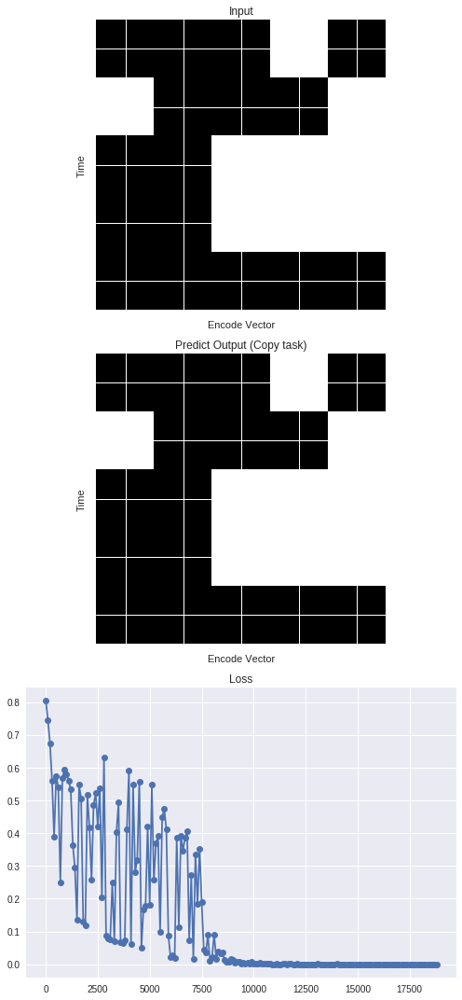

KeyboardInterrupt: ignored

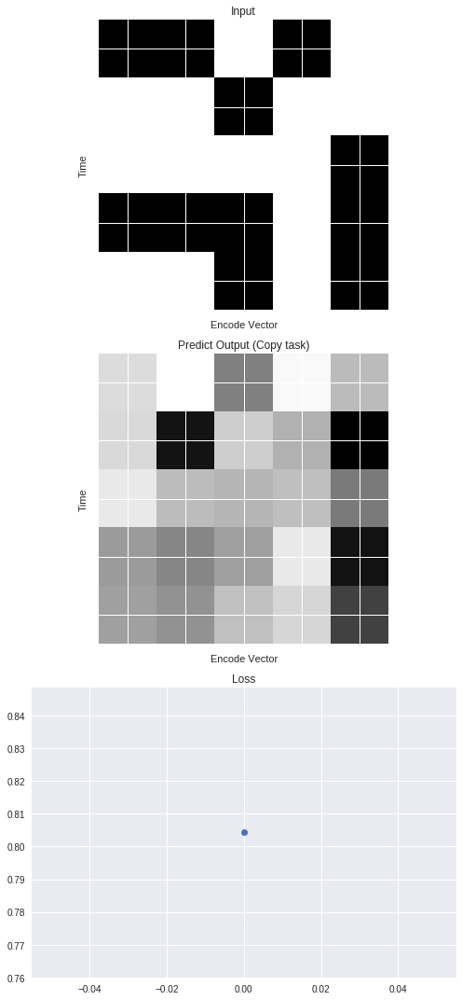

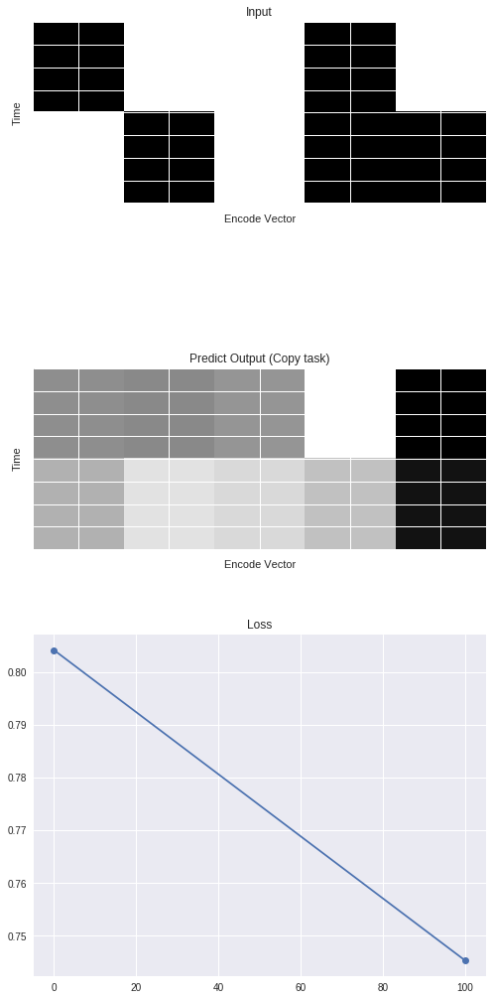

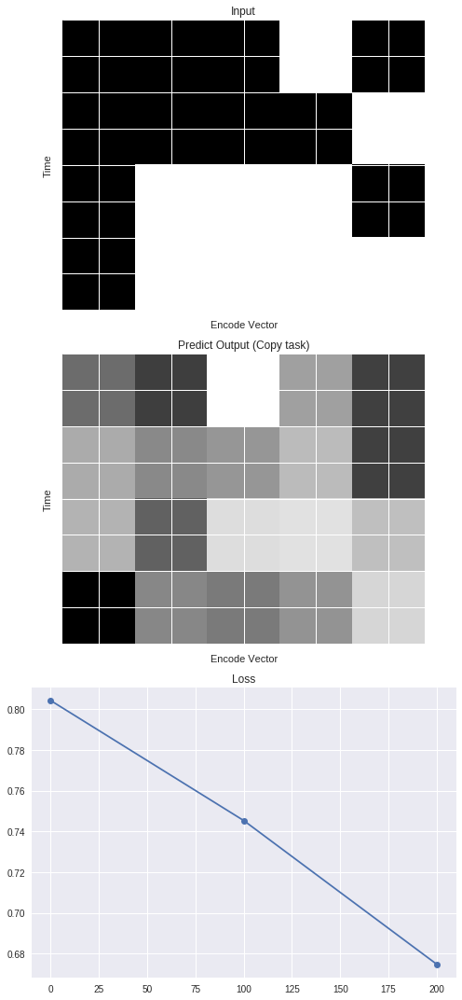

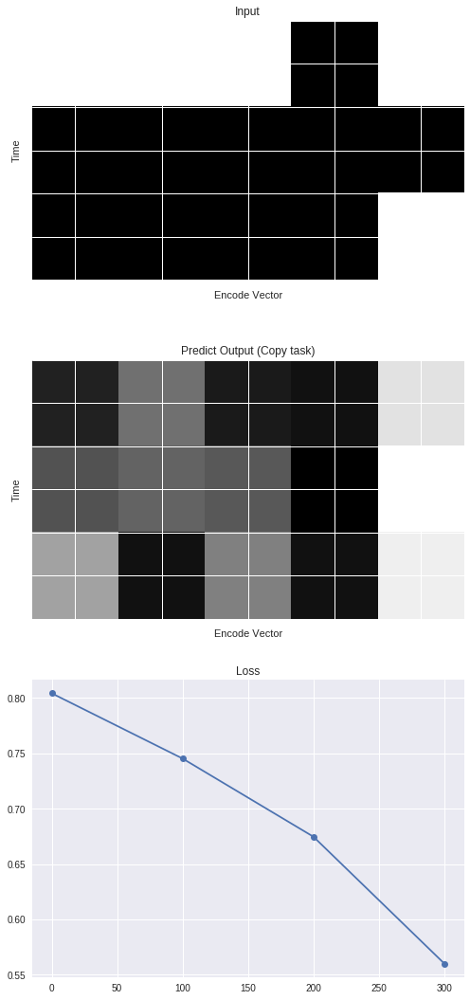

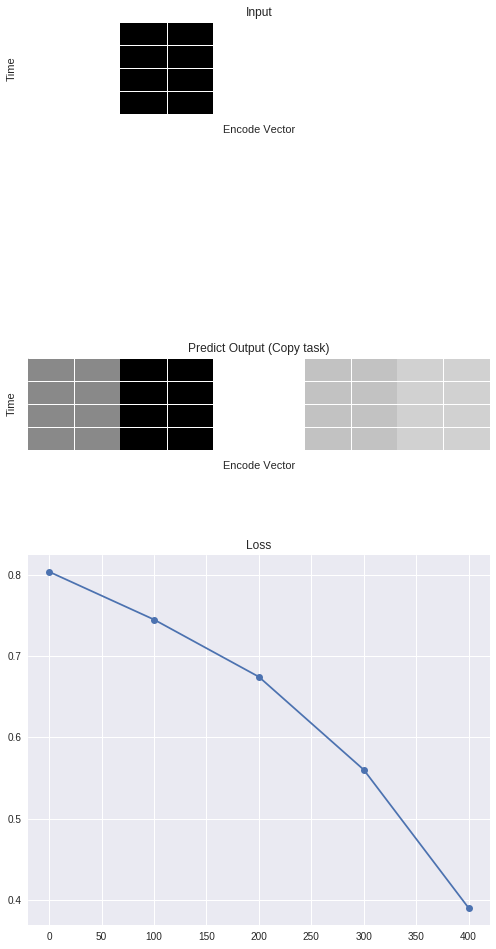

...

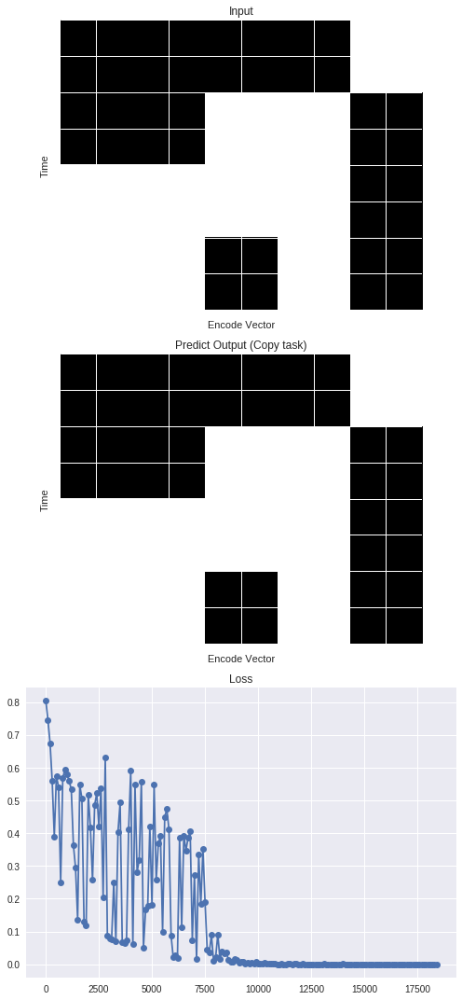

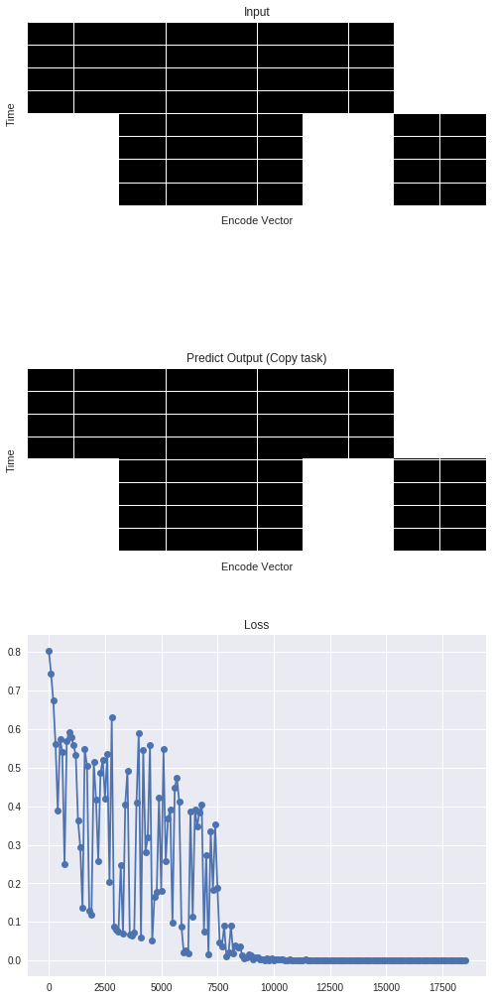

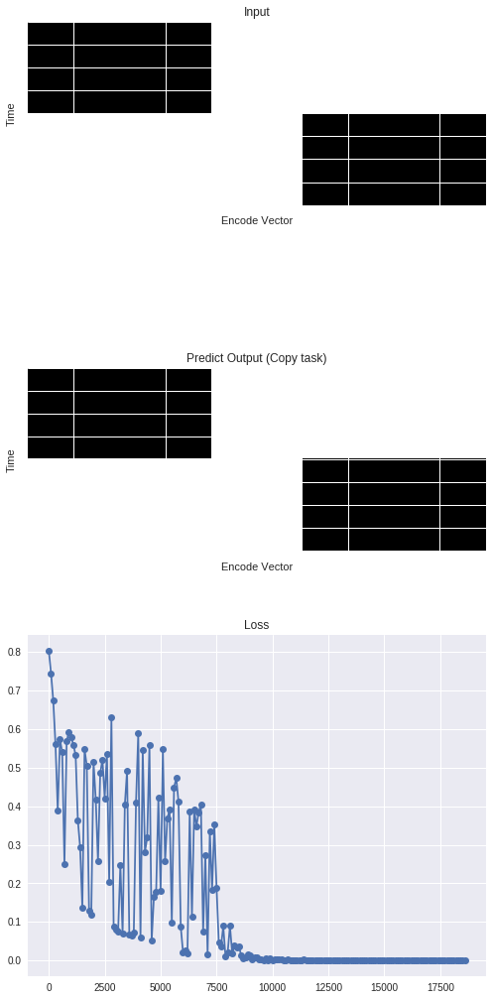

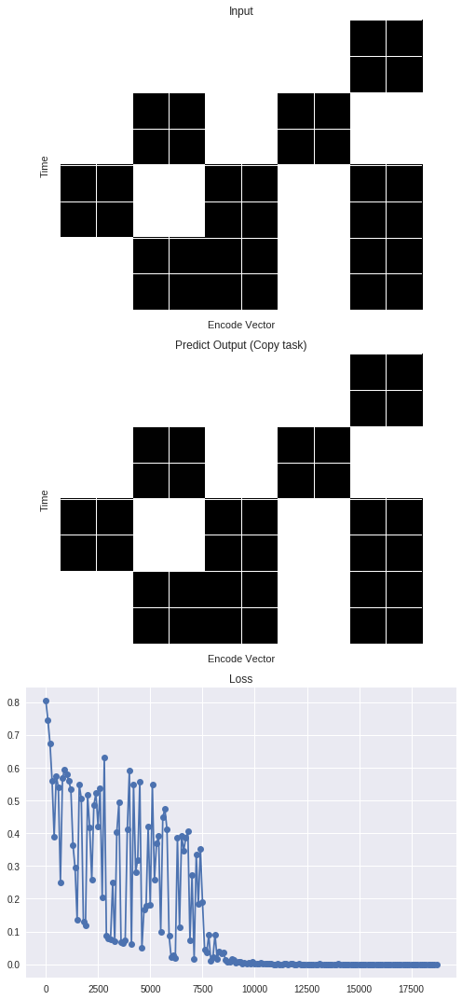

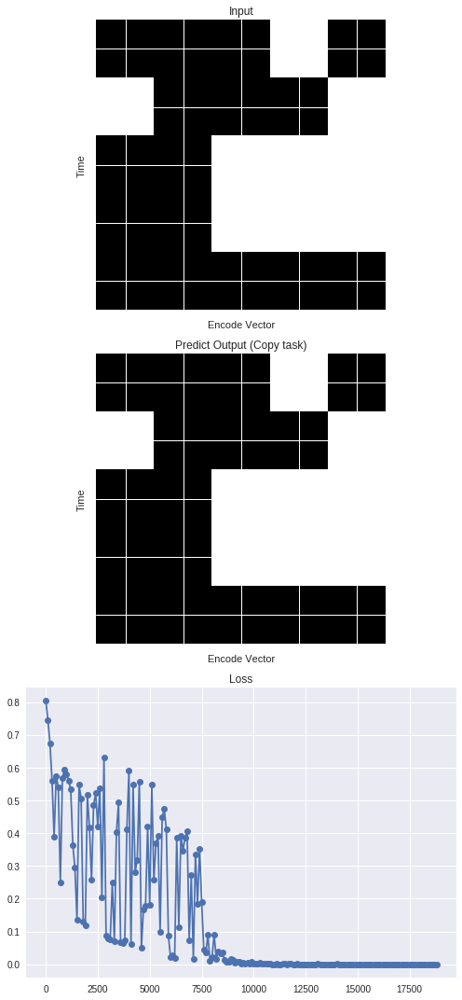

In [10]:
def create_config():
    config = dict()
    config['mode'] = 'train'
    config['restore_training'] = False
    config['model'] = 'NTM'
    config['rnn_num_layers'] = 3
    config['rnn_size'] = 32#64
    config['max_seq_length'] = 5
    config['memory_size'] = 32#128
    config['memory_vector_dim'] = 10#20
    config['batch_size'] = 10
    config['vector_dim'] = 5#8
    config['shift_range'] = 1
    config['num_epoches'] = 1000000
    config['learning_rate'] = 1e-4
    config['save_dir'] = 'data/'
    
    return config

def generate_random_strings(batch_size, seq_length, vector_dim):
    return np.random.randint(0, 2, size=[batch_size, seq_length, vector_dim]).astype(np.float32)

def train(config):
    tf.reset_default_graph()
    model_list = [NTMCopyModel(config, 1)]
    for seq_length in range(2, config['max_seq_length'] + 1):
        print('',end='\r')
        print(str(seq_length), end='')
        model_list.append(NTMCopyModel(config, seq_length, reuse=True))
    with tf.Session() as sess:
        batches_idx_list = []
        copy_loss_list = []
        if config['restore_training']:
            saver = tf.train.Saver()
            ckpt = tf.train.get_checkpoint_state(config['save_dir'])
            saver.restore(sess, ckpt.model_checkpoint_path)
        else:
            saver = tf.train.Saver(tf.global_variables())
            tf.global_variables_initializer().run()
        
        for b in range(config['num_epoches']):
            seq_length = np.random.randint(1, config['max_seq_length'] + 1)
            model = model_list[seq_length - 1]
            x = generate_random_strings(config['batch_size'], seq_length, config['vector_dim'])
            feed_dict = {model.x: x}
            if b % 100 == 0:        # test
                p = 0               # select p th sample in the batch to show
                print_input = x[p, :, :]
                print_output = sess.run(model.o, feed_dict=feed_dict)[p, :, :]
                state_list = sess.run(model.state_list, feed_dict=feed_dict)
                if config['model'] == 'NTM':
                    w_plot = []
                    read_head_locations = []
                    write_head_locations = []
                    M_plot = np.concatenate([state['M'][p, :, :] for state in state_list])
                    for state in state_list:
                        read_head_locations.append(state['w_list'][0][p, :])
                        write_head_locations.append(state['w_list'][1][p, :])
                    plot_read_location = np.stack(read_head_locations)
                    plot_write_location = np.stack(write_head_locations)
                    
                copy_loss = sess.run(model.copy_loss, feed_dict=feed_dict)
                copy_loss_list.append(copy_loss)
                batches_idx_list.append(b)
                merged_summary = sess.run(model.copy_loss_summary, feed_dict=feed_dict)
                display.clear_output(wait=True)
                f, ((ax11), (ax12), (ax13)) = plt.subplots(3, 1, sharex=False, sharey=False, figsize=(7,15))
                ax11.imshow(print_input)
                ax11.set_xlabel('Encode Vector')
                ax11.set_ylabel('Time')
                ax11.title.set_text('Input')
                ax11.set_xticklabels([])
                ax11.set_yticklabels([])
                ax12.imshow(print_output)
                ax12.set_xlabel('Encode Vector')
                ax12.set_ylabel('Time')
                ax12.title.set_text('Predict Output (Copy task)')
                ax12.set_xticklabels([])
                ax12.set_yticklabels([])
                ax13.plot(np.array(batches_idx_list), np.array(copy_loss_list), '-o')
                ax13.title.set_text('Loss')
                plt.tight_layout()
                display.display(plt.gcf())
                if not os.path.exists('data'):
                    os.mkdir('data')
                if copy_loss_list[-1] < 0.15 and config['mode'] == 'train':
                    saver.save(sess, 'data/model.tfmodel', global_step=b)      
            else:                   # train
                if config['mode'] == 'train':
                    sess.run(model.train_op, feed_dict=feed_dict)
config = create_config()
train(config)